<a href="https://colab.research.google.com/github/santhoshsuresh/Machine-Learning-Project/blob/main/GAN_MLP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **GAN constructed with MLP**

In [32]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

# Function for visualizing images to plot the images in a uniform grid
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [33]:
# Generator block (one layer)
def get_generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [34]:
#  Entire Generator Structure - Takes random noise and generates an image
class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )

    def forward(self, noise):
        return self.gen(noise)
    
    def get_gen(self):
        return self.gen

In [35]:
# Generates a random noise vector from normal distribution for n_samples
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, device=device)

In [36]:
# Discriminator Block Structure
def get_discriminator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
    )

In [37]:
# Complete Discriminator structure
class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)
    
    def get_disc(self):
        return self.disc

In [38]:
# Set training parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 1000
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [39]:
#  Initialize the optimizer for generator and Discriminator
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [40]:
#Calculate discrmintor loss by feeding the output from generator and real image from training dataset
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device)
    gen_output = gen(noise)
    gen_disc_output = disc(gen_output.detach())
    
    # Label 'fake' is used for generator ouput
    gen_disc_loss = criterion(gen_disc_output, torch.zeros_like(gen_disc_output))
    
    # Label 'True' is for real image
    disc_output = disc(real)
    true_loss = criterion(disc_output, torch.ones_like(disc_output))
    
    disc_loss = (true_loss + gen_disc_loss)/2
    return disc_loss

In [41]:
# Calculate generator loss by comparing the output from discriminator
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device)
    gen_output = gen(noise)
    gen_disc_output = disc(gen_output)

    # Loss is calculated to fool the disciminator
    gen_loss = criterion(gen_disc_output, torch.ones_like(gen_disc_output))
    return gen_loss

Step 1000: Generator loss: 1.5308863870501517, discriminator loss: 0.35938352839648785


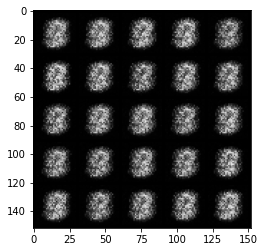

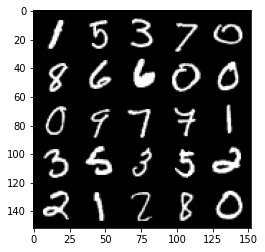

Step 2000: Generator loss: 1.8646332330703734, discriminator loss: 0.18521427844464775


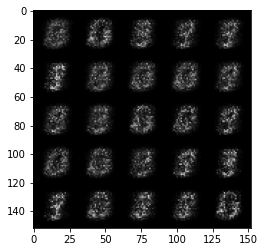

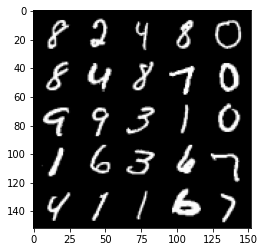

Step 3000: Generator loss: 1.8759120807647687, discriminator loss: 0.1727845201641315


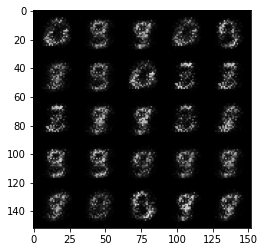

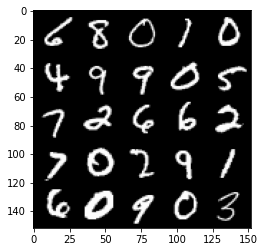

Step 4000: Generator loss: 2.5909292752742754, discriminator loss: 0.12624959440529337


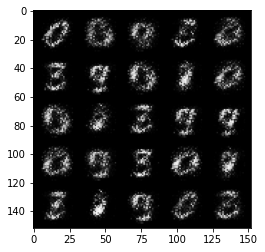

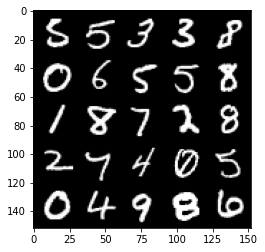

Step 5000: Generator loss: 3.19445378899574, discriminator loss: 0.09644021546840661


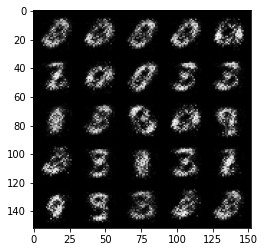

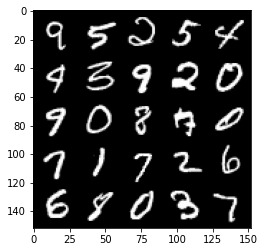

Step 6000: Generator loss: 3.6012471518516564, discriminator loss: 0.08080474635958665


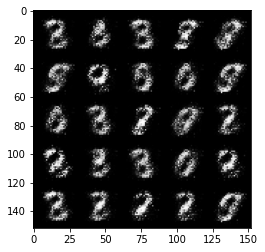

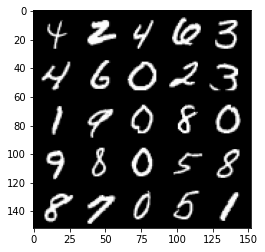

Step 7000: Generator loss: 3.9245383014678965, discriminator loss: 0.05650662252306936


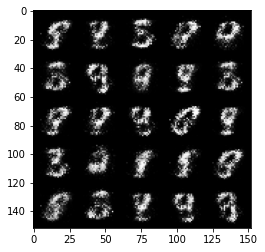

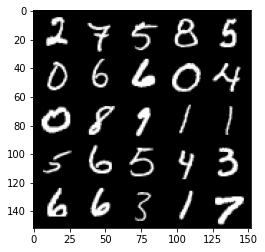

Step 8000: Generator loss: 4.163916453361509, discriminator loss: 0.054729057651013116


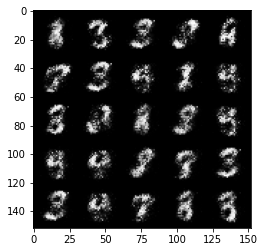

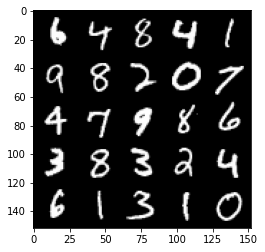

Step 9000: Generator loss: 4.192255662679672, discriminator loss: 0.05626108973473315


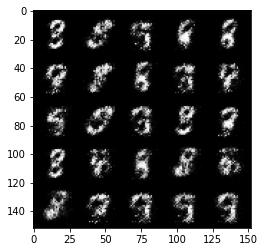

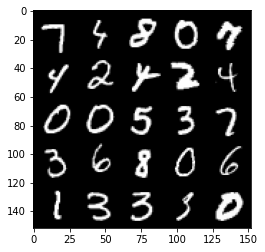

Step 10000: Generator loss: 4.056065623044969, discriminator loss: 0.06063318223878743


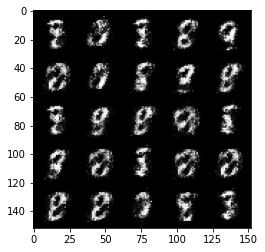

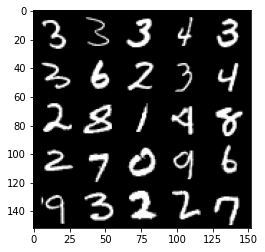

Step 11000: Generator loss: 4.028891671657561, discriminator loss: 0.06612494521774354


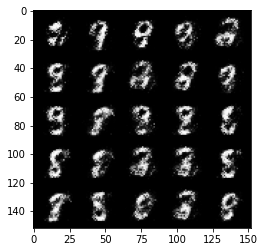

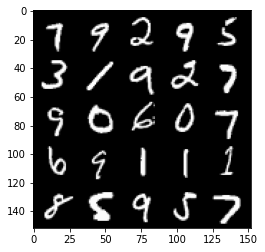

Step 12000: Generator loss: 4.171159912824628, discriminator loss: 0.07563475901074725


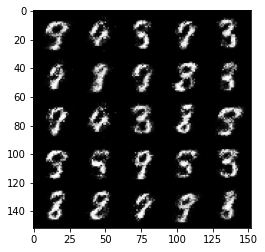

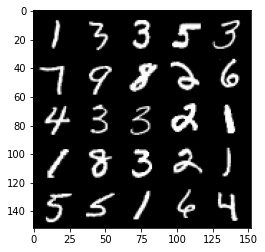

Step 13000: Generator loss: 3.8829882977008805, discriminator loss: 0.08806588366255169


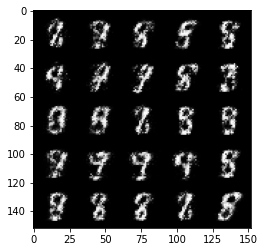

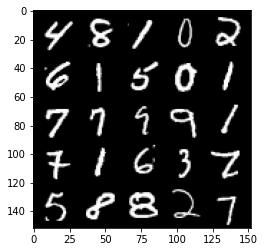

Step 14000: Generator loss: 3.7240720484256724, discriminator loss: 0.1061919830664993


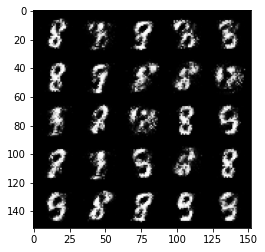

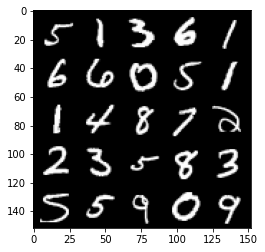

Step 15000: Generator loss: 3.8584909474849747, discriminator loss: 0.10582251969724907


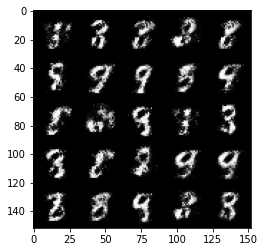

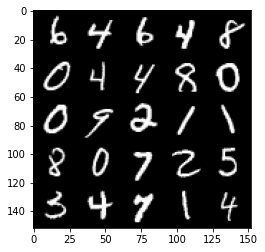

Step 16000: Generator loss: 3.6804049885272985, discriminator loss: 0.11452983542531724


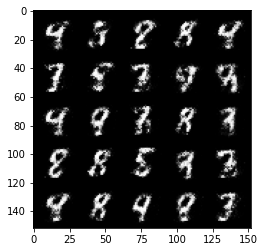

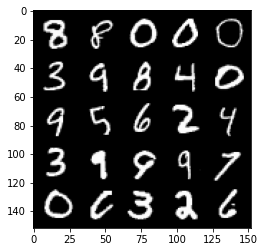

Step 17000: Generator loss: 3.575004200458525, discriminator loss: 0.12819508842378835


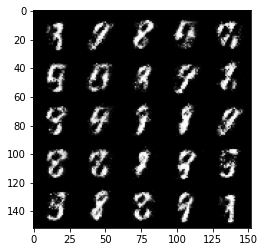

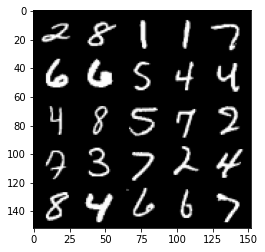

Step 18000: Generator loss: 3.4785732064247203, discriminator loss: 0.13408175384625773


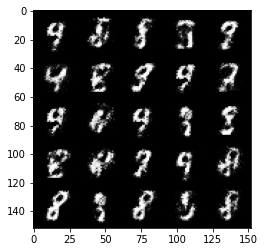

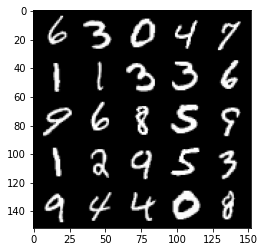

Step 19000: Generator loss: 3.3297622840404504, discriminator loss: 0.14353314372897158


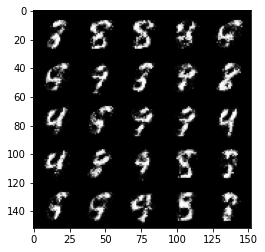

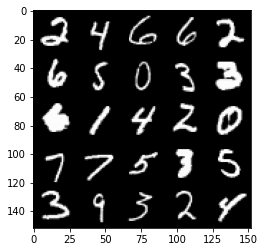

Step 20000: Generator loss: 3.2869548346996322, discriminator loss: 0.13846708842366912


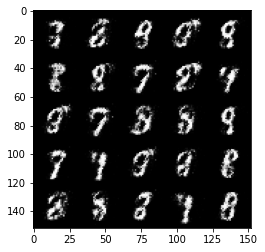

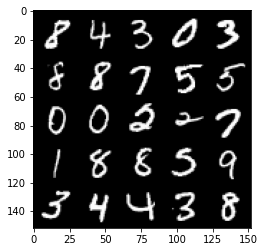

Step 21000: Generator loss: 3.2412680227756443, discriminator loss: 0.14054011087864635


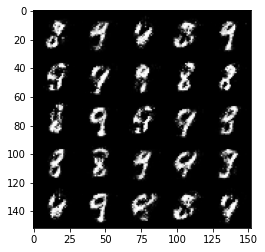

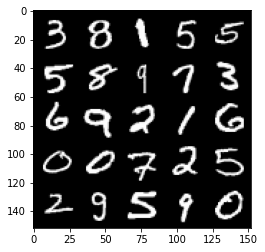

Step 22000: Generator loss: 3.1658796653747587, discriminator loss: 0.16148877762258068


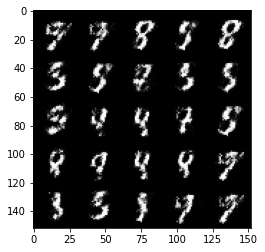

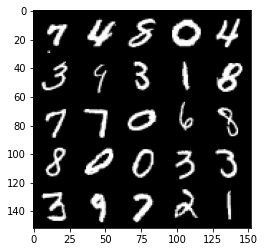

Step 23000: Generator loss: 3.245284376621248, discriminator loss: 0.14933980561047802


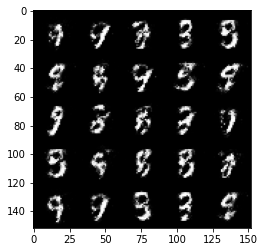

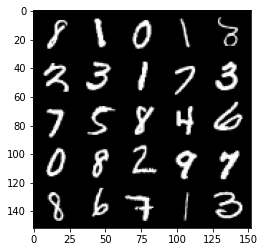

Step 24000: Generator loss: 3.0123174183368677, discriminator loss: 0.1760926875695586


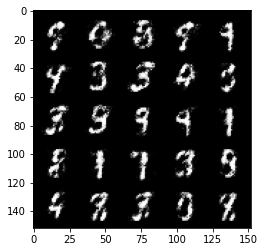

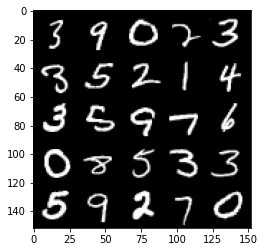

Step 25000: Generator loss: 3.056743148803708, discriminator loss: 0.171809224165976


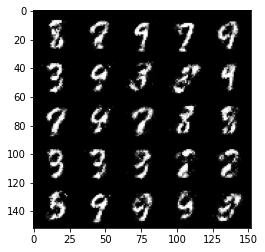

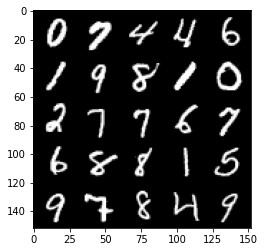

Step 26000: Generator loss: 2.8493790132999446, discriminator loss: 0.19838674814999135


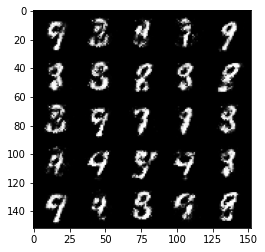

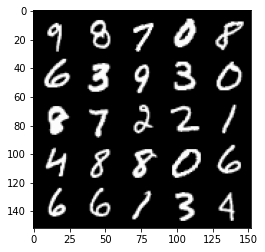

Step 27000: Generator loss: 2.903545844793321, discriminator loss: 0.2012595792636275


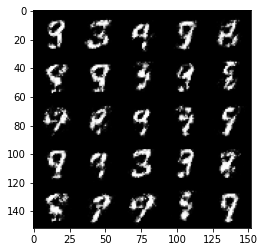

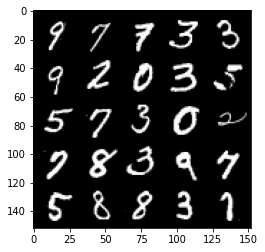

Step 28000: Generator loss: 2.8005028033256485, discriminator loss: 0.2046913147196173


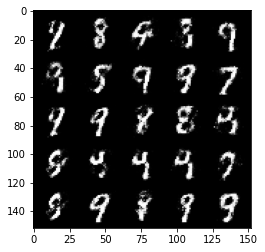

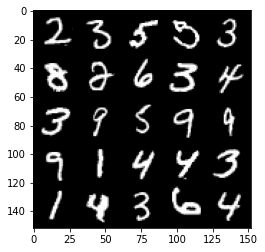

Step 29000: Generator loss: 2.632758445978162, discriminator loss: 0.22557328563183576


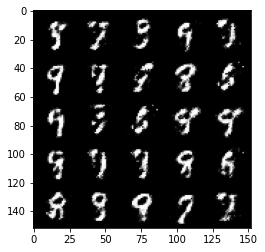

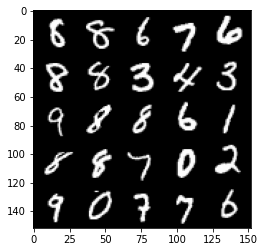

Step 30000: Generator loss: 2.549380951642989, discriminator loss: 0.23339804449677465


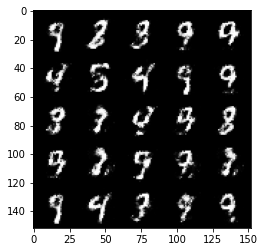

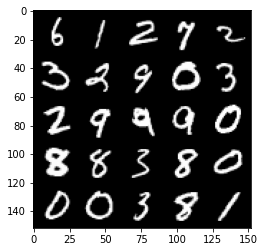

Step 31000: Generator loss: 2.414479899764063, discriminator loss: 0.2549017748683691


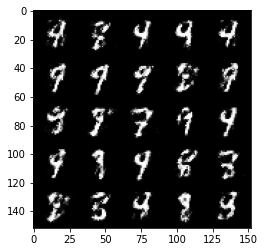

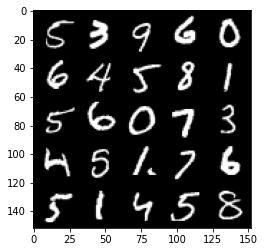

Step 32000: Generator loss: 2.451904591560363, discriminator loss: 0.23670897656679138


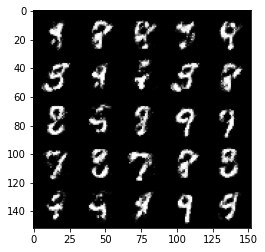

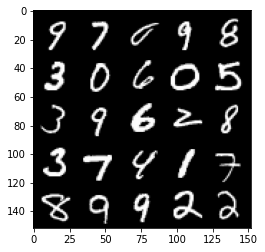

Step 33000: Generator loss: 2.389130515456201, discriminator loss: 0.25855607943236786


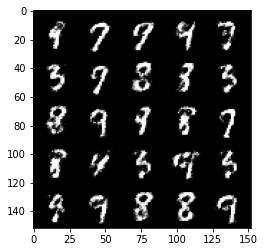

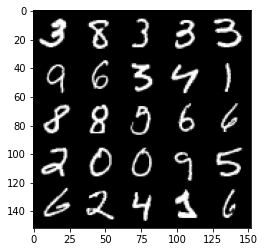

Step 34000: Generator loss: 2.3419352675676364, discriminator loss: 0.2514208051264285


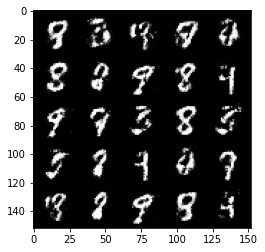

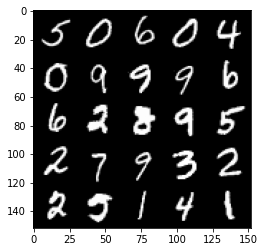

Step 35000: Generator loss: 2.265643850326537, discriminator loss: 0.2831612421274187


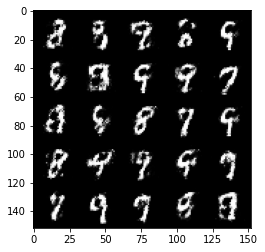

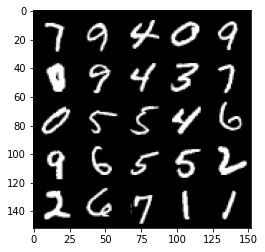

Step 36000: Generator loss: 2.3473558170795483, discriminator loss: 0.2609750414490698


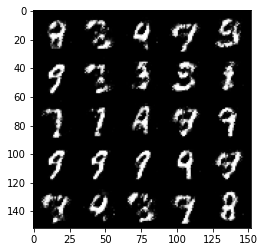

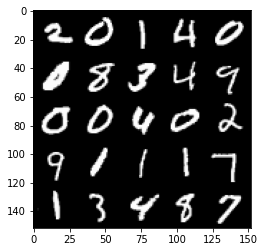

Step 37000: Generator loss: 2.243265067934989, discriminator loss: 0.28227438870072386


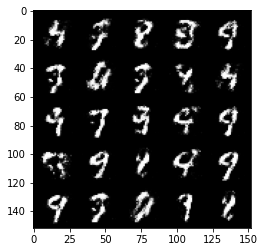

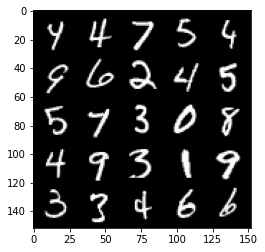

Step 38000: Generator loss: 2.302641620516776, discriminator loss: 0.2667829211056233


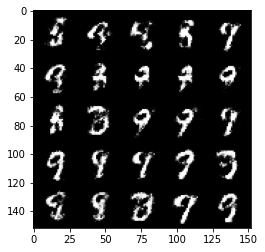

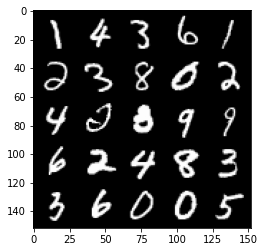

Step 39000: Generator loss: 2.3761580392122275, discriminator loss: 0.2575822164714335


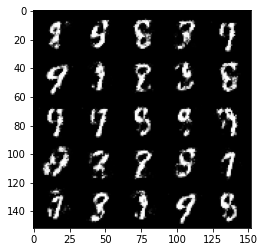

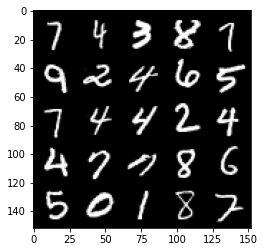

Step 40000: Generator loss: 2.2178397824764238, discriminator loss: 0.27548886166512965


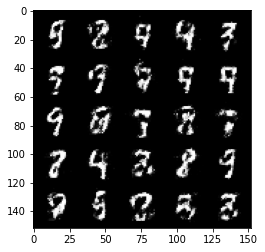

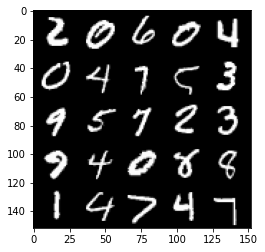

Step 41000: Generator loss: 2.2443378473520275, discriminator loss: 0.2732228588014839


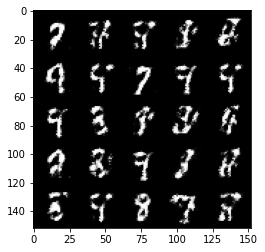

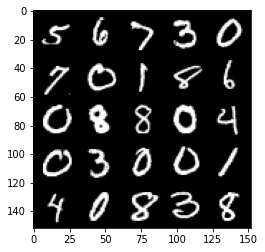

Step 42000: Generator loss: 2.1485495979785907, discriminator loss: 0.28759494137763986


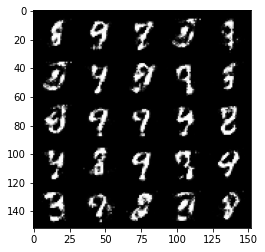

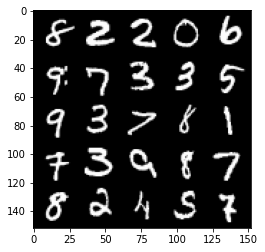

Step 43000: Generator loss: 2.1615207356214503, discriminator loss: 0.28450102630257557


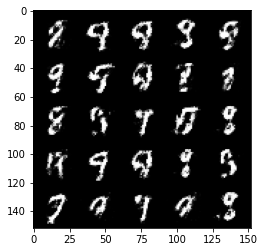

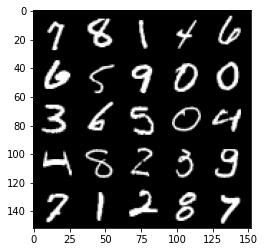

Step 44000: Generator loss: 2.1451746515035657, discriminator loss: 0.29091057287156574


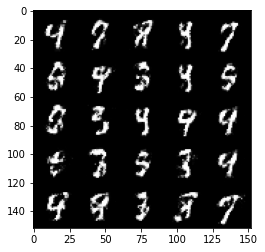

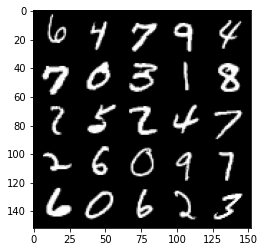

Step 45000: Generator loss: 2.12620656275749, discriminator loss: 0.2961931175589563


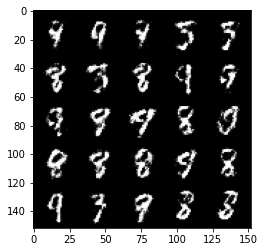

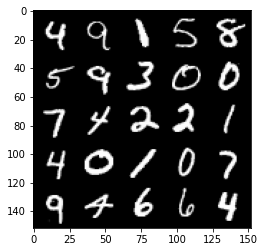

Step 46000: Generator loss: 2.0816548713445666, discriminator loss: 0.30240667654573916


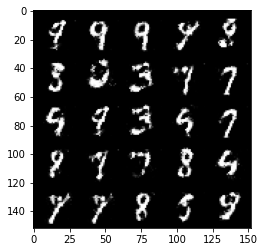

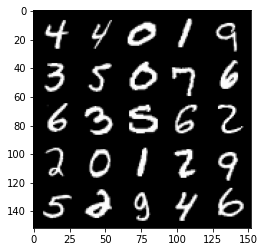

Step 47000: Generator loss: 2.075504616260531, discriminator loss: 0.3048241912275553


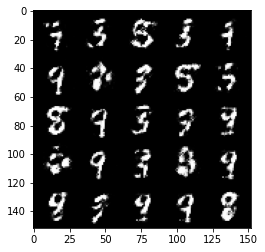

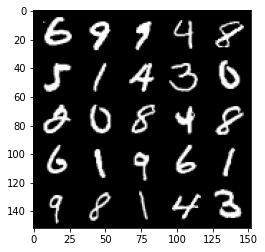

Step 48000: Generator loss: 2.049712149977684, discriminator loss: 0.31245019184052963


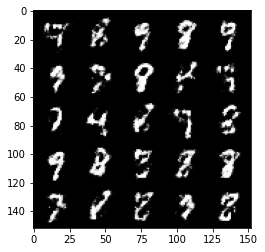

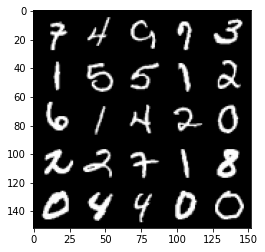

Step 49000: Generator loss: 2.0716952816247924, discriminator loss: 0.2981872499287131


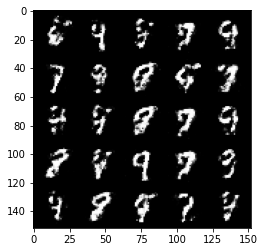

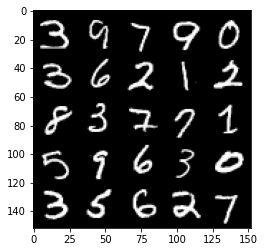

Step 50000: Generator loss: 1.9769221553802498, discriminator loss: 0.31183939991891363


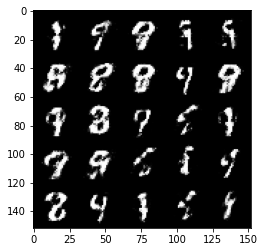

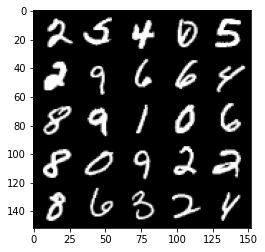

Step 51000: Generator loss: 2.015540496230126, discriminator loss: 0.3053021018654113


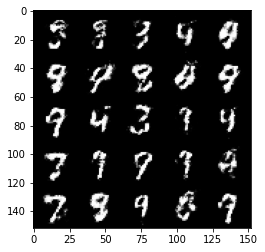

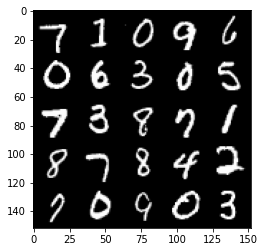

Step 52000: Generator loss: 1.8803978236913688, discriminator loss: 0.34424917271733235


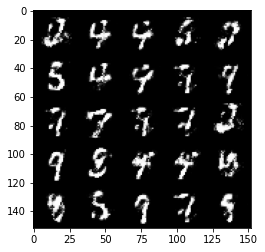

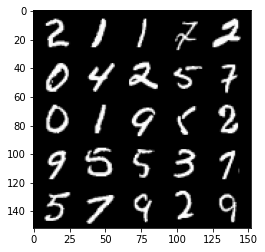

Step 53000: Generator loss: 1.9720806852579102, discriminator loss: 0.319754047498107


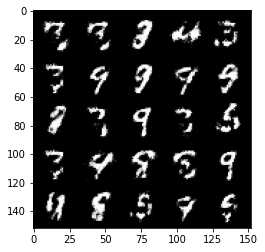

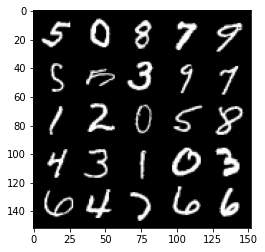

Step 54000: Generator loss: 1.8340840897560127, discriminator loss: 0.36281684765219674


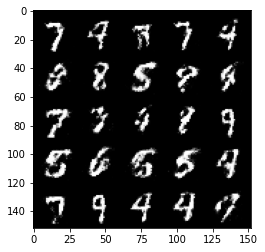

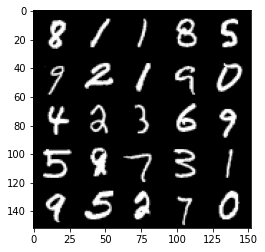

Step 55000: Generator loss: 1.9065651191473028, discriminator loss: 0.34169508558511746


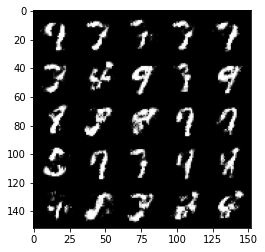

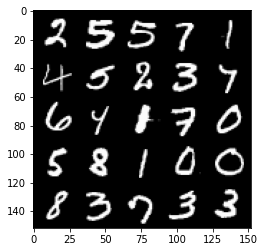

Step 56000: Generator loss: 1.8993158781528459, discriminator loss: 0.3324597457349305


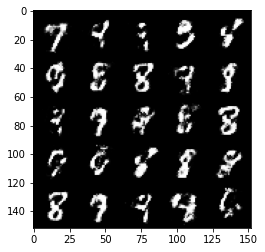

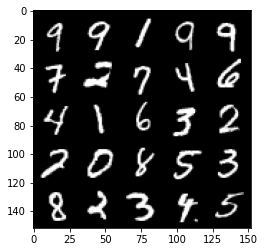

Step 57000: Generator loss: 1.9550656037330616, discriminator loss: 0.3112550999522214


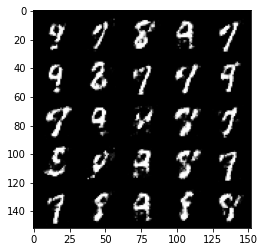

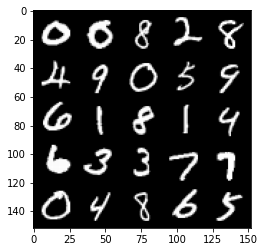

Step 58000: Generator loss: 1.8733215098381035, discriminator loss: 0.34289031472802123


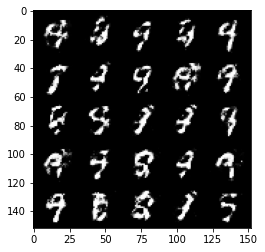

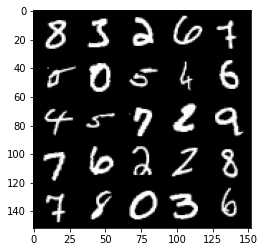

Step 59000: Generator loss: 1.856432913303374, discriminator loss: 0.3455926906466487


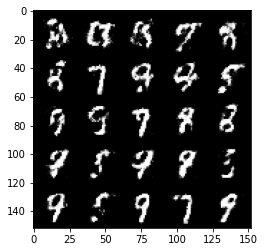

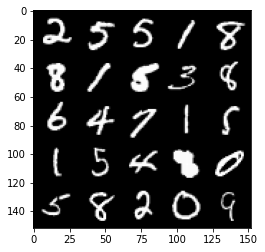

Step 60000: Generator loss: 1.809730370879177, discriminator loss: 0.36371850940585193


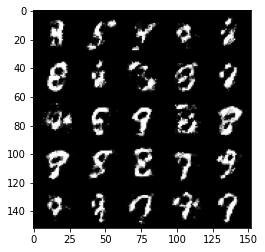

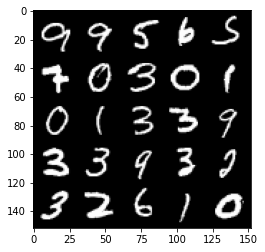

Step 61000: Generator loss: 1.7682674330472945, discriminator loss: 0.36642914217710515


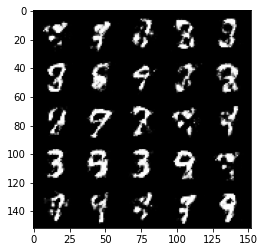

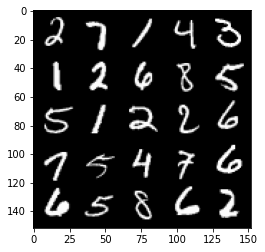

Step 62000: Generator loss: 1.7108967970609668, discriminator loss: 0.37988804364204465


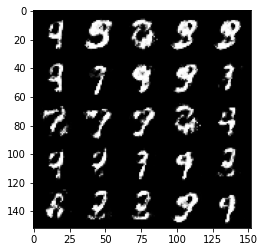

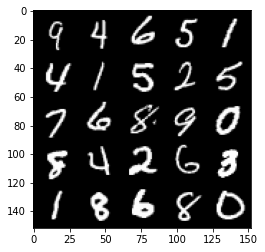

Step 63000: Generator loss: 1.6432365648746492, discriminator loss: 0.40002993446588464


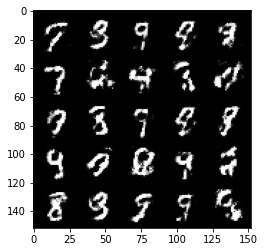

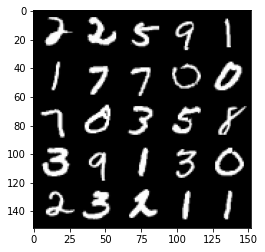

Step 64000: Generator loss: 1.6293651565313352, discriminator loss: 0.3988889957368376


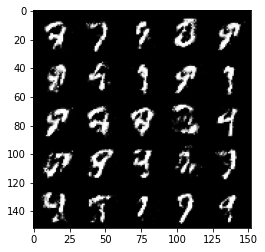

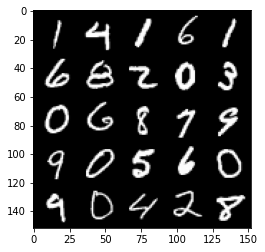

Step 65000: Generator loss: 1.756041446685792, discriminator loss: 0.3596455236077309


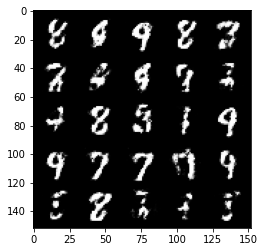

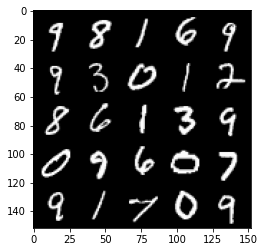

Step 66000: Generator loss: 1.6981959851980184, discriminator loss: 0.37223193541169186


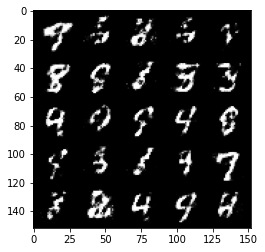

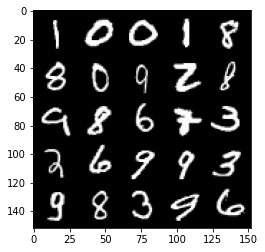

Step 67000: Generator loss: 1.676359991312024, discriminator loss: 0.3820973270237447


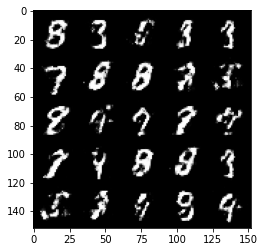

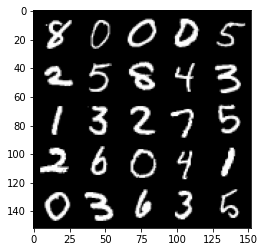

Step 68000: Generator loss: 1.6116545023918163, discriminator loss: 0.4036477729976175


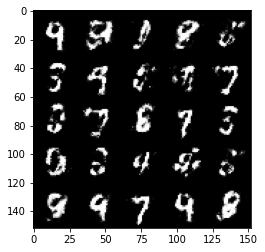

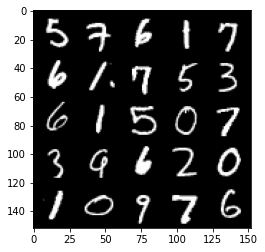

Step 69000: Generator loss: 1.5882594321966177, discriminator loss: 0.3960133642256261


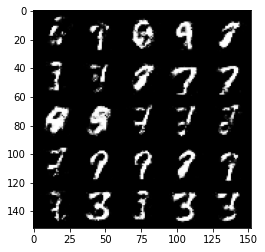

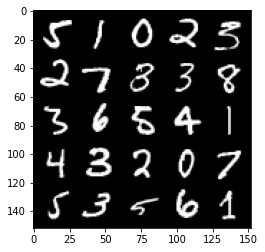

Step 70000: Generator loss: 1.5961280227899541, discriminator loss: 0.3974265900552274


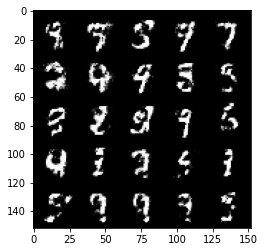

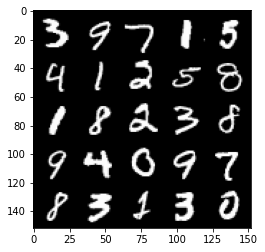

Step 71000: Generator loss: 1.5384647852182385, discriminator loss: 0.41734065237641316


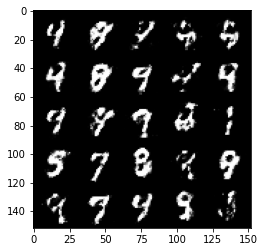

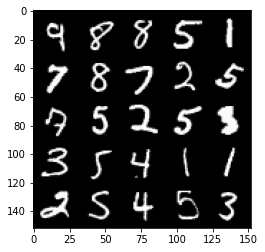

Step 72000: Generator loss: 1.58959238433838, discriminator loss: 0.3946929132938384


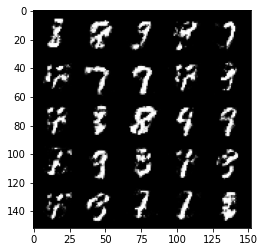

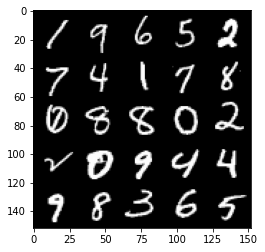

Step 73000: Generator loss: 1.6693161319494245, discriminator loss: 0.3711808348298074


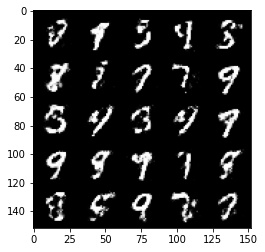

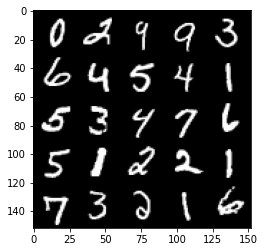

Step 74000: Generator loss: 1.6794255383014676, discriminator loss: 0.3677368438839914


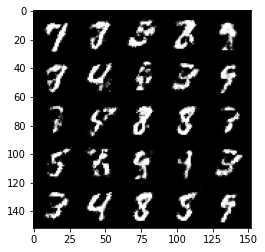

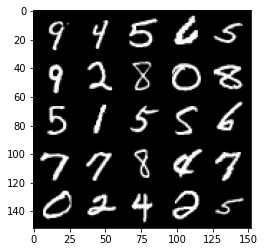

Step 75000: Generator loss: 1.5831645522117603, discriminator loss: 0.3967959840297703


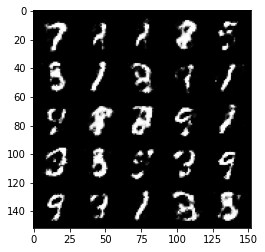

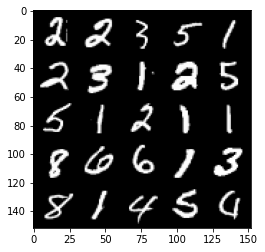

Step 76000: Generator loss: 1.5813976010084139, discriminator loss: 0.39477922523021675


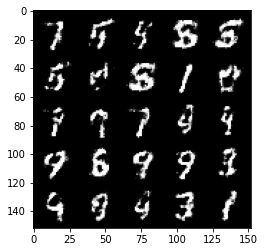

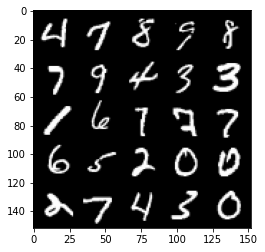

Step 77000: Generator loss: 1.4891929088830986, discriminator loss: 0.43139874178171195


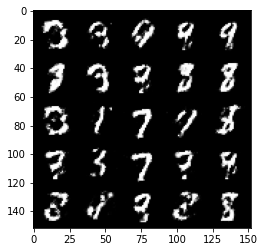

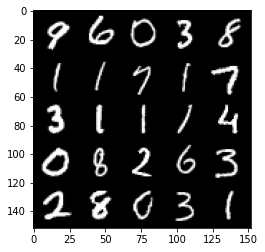

Step 78000: Generator loss: 1.4974264534711834, discriminator loss: 0.4204504007995125


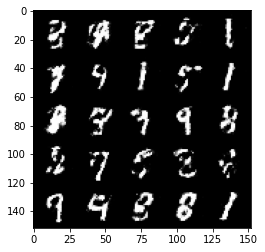

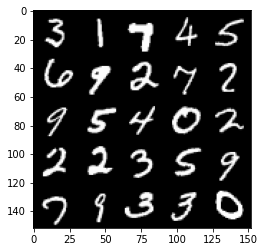

Step 79000: Generator loss: 1.4563425897359858, discriminator loss: 0.43250097301602397


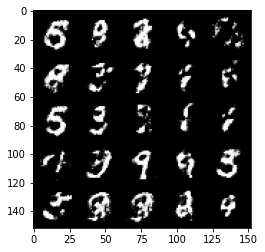

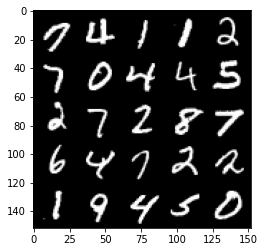

Step 80000: Generator loss: 1.4389626860618616, discriminator loss: 0.43994960519671417


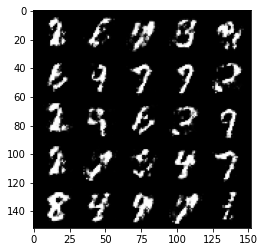

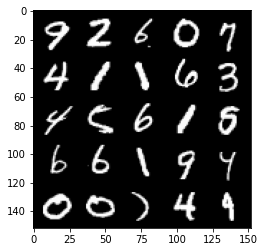

Step 81000: Generator loss: 1.422186716794966, discriminator loss: 0.44768001350760483


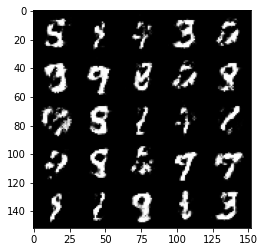

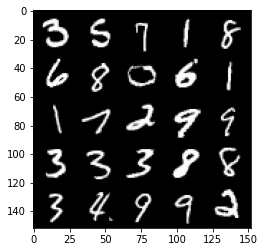

Step 82000: Generator loss: 1.3794016034603116, discriminator loss: 0.4592189143896105


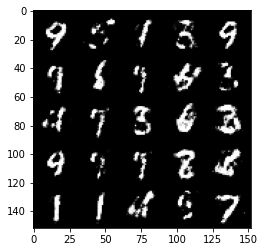

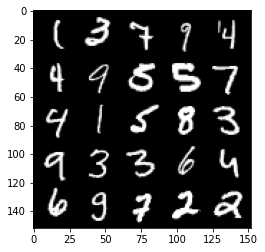

Step 83000: Generator loss: 1.3288326762914657, discriminator loss: 0.4620430403649805


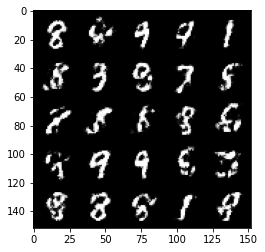

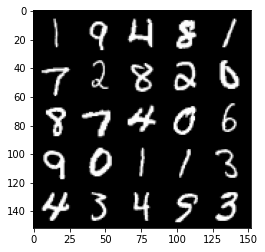

Step 84000: Generator loss: 1.315697206497192, discriminator loss: 0.4838253460824492


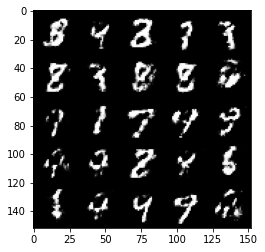

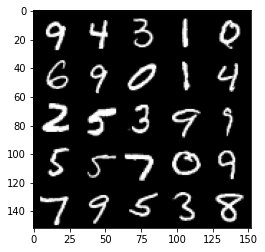

Step 85000: Generator loss: 1.3008163728713995, discriminator loss: 0.47071453669667235


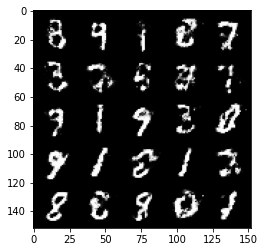

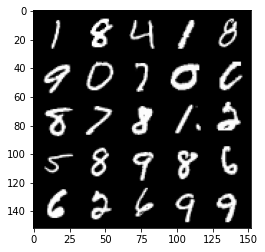

Step 86000: Generator loss: 1.2753347418308263, discriminator loss: 0.4891229992508884


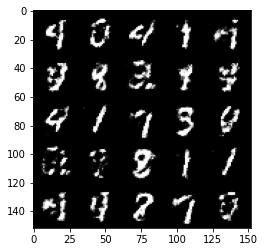

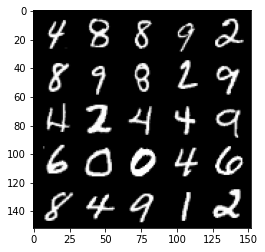

Step 87000: Generator loss: 1.2760596245527263, discriminator loss: 0.49342412444949196


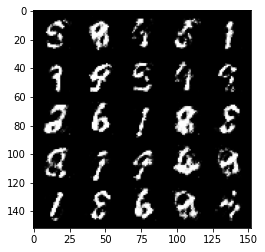

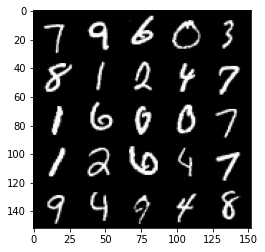

Step 88000: Generator loss: 1.2535703660249713, discriminator loss: 0.489189921379089


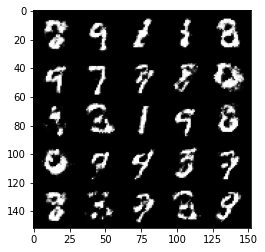

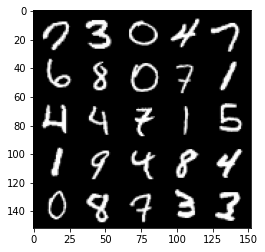

Step 89000: Generator loss: 1.2777811578512184, discriminator loss: 0.47357137951254924


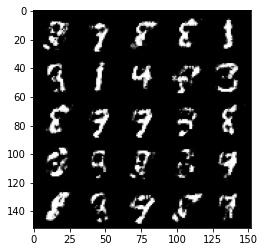

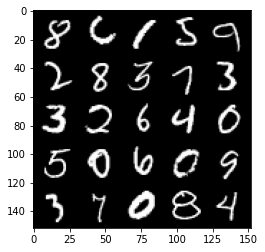

Step 90000: Generator loss: 1.2806336395144444, discriminator loss: 0.4856953674554826


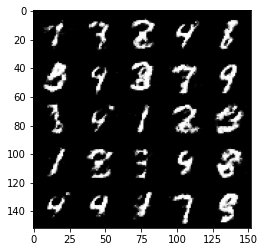

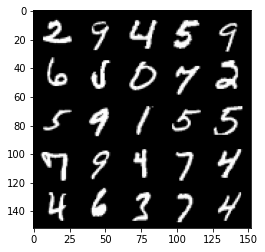

Step 91000: Generator loss: 1.2111090537309648, discriminator loss: 0.4997049922049048


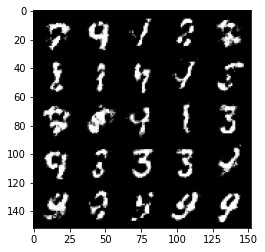

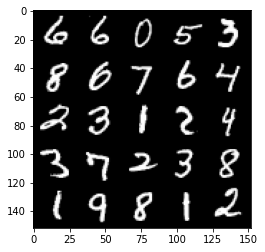

Step 92000: Generator loss: 1.2354331281185167, discriminator loss: 0.48335372734069765


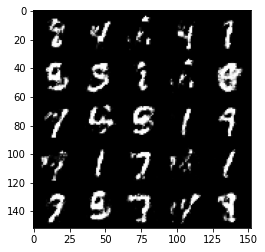

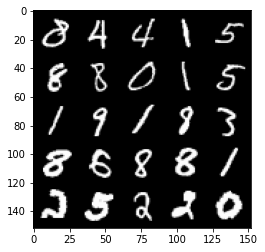

Step 93000: Generator loss: 1.214553954482079, discriminator loss: 0.4935628168582919


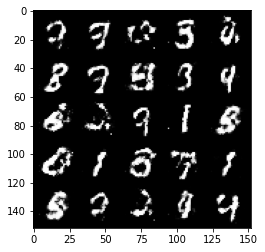

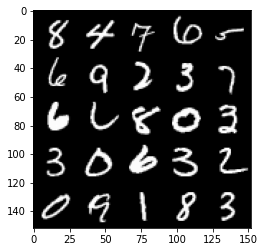

In [42]:
# Initiate training of GAN
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        # Update discriminator ###
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        # Update Generator
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()

        mean_discriminator_loss += disc_loss.item() / display_step
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
